# Package

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder

# Data

Business goal: To classify and predict whether a borrower has fully repaid the loan or not.
Analyze the behavior of borrowers who are able to repay their loans in full.

Data Description

data source -> https://www.kaggle.com/datasets/saramah/loan-data?resource=download

- credit.policy: 1 if the customer meets the credit underwriting criteria of LendingClub.com, and 0 otherwise.

- purpose: The purpose of the loan (takes values "credit_card", "debt_consolidation", "educational", "major_purchase", "small_business", and "all_other").

- int.rate: The interest rate of the loan, as a proportion (a rate of 11% would be stored as 0.11). Borrowers judged by LendingClub.com to be more risky are assigned higher interest rates.

- installment: The monthly installments owed by the borrower if the loan is funded.

- log.annual.inc: The natural log of the self-reported annual income of the borrower.

- dti: The debt-to-income ratio of the borrower (amount of debt divided by annual income).

- fico: The FICO credit score of the borrower.

- days.with.cr.line: The number of days the borrower has had a credit line.

- revol.bal: The borrower's revolving balance (amount unpaid at the end of the credit card billing cycle).

- revol.util: The borrower's revolving line utilization rate (the amount of the credit line used relative to total credit available).

- inq.last.6mths: The borrower's number of inquiries by creditors in the last 6 months.

- delinq.2yrs: The number of times the borrower had been 30+ days past due on a payment in the past 2 years.

- pub.rec: The borrower's number of derogatory public records (bankruptcy filings, tax liens, or judgments).

In [3]:
# Load dataset from csv
df = pd.read_csv('loan_data.csv')
df

,credit.policy,purpose,int.rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util,inq.last.6mths,delinq.2yrs,pub.rec,not.fully.paid
0,1,debt_consolidation,0.1189,829.10,11.350407,19.48,737,5639.958333,28854,52.1,0,0,0,0
1,1,credit_card,0.1071,228.22,11.082143,14.29,707,2760.000000,33623,76.7,0,0,0,0
2,1,debt_consolidation,0.1357,366.86,10.373491,11.63,682,4710.000000,3511,25.6,1,0,0,0
3,1,debt_consolidation,0.1008,162.34,11.350407,8.10,712,2699.958333,33667,73.2,1,0,0,0
4,1,credit_card,0.1426,102.92,11.299732,14.97,667,4066.000000,4740,39.5,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9573,0,all_other,0.1461,344.76,12.180755,10.39,672,10474.000000,215372,82.1,2,0,0,1
9574,0,all_other,0.1253,257.70,11.141862,0.21,722,4380.000000,184,1.1,5,0,0,1
9575,0,debt_consolidation,0.1071,97.81,10.596635,13.09,687,3450.041667,10036,82.9,8,0,0,1
9576,0,home_improvement,0.1600,351.58,10.819778,19.18,692,1800.000000,0,3.2,5,0,0,1


In [4]:
# Show general statistics of data
df.describe().T

,count,mean,std,min,25%,50%,75%,max
credit.policy,9578.0,0.804970,0.396245,0.000000,1.000000,1.000000,1.000000,1.000000e+00
int.rate,9578.0,0.122640,0.026847,0.060000,0.103900,0.122100,0.140700,2.164000e-01
installment,9578.0,319.089413,207.071301,15.670000,163.770000,268.950000,432.762500,9.401400e+02
log.annual.inc,9578.0,10.932117,0.614813,7.547502,10.558414,10.928884,11.291293,1.452835e+01
dti,9578.0,12.606679,6.883970,0.000000,7.212500,12.665000,17.950000,2.996000e+01
fico,9578.0,710.846314,37.970537,612.000000,682.000000,707.000000,737.000000,8.270000e+02
days.with.cr.line,9578.0,4560.767197,2496.930377,178.958333,2820.000000,4139.958333,5730.000000,1.763996e+04
revol.bal,9578.0,16913.963876,33756.189557,0.000000,3187.000000,8596.000000,18249.500000,1.207359e+06
revol.util,9578.0,46.799236,29.014417,0.000000,22.600000,46.300000,70.900000,1.190000e+02
inq.last.6mths,9578.0,1.577469,2.200245,0.000000,0.000000,1.000000,2.000000,3.300000e+01


# EDA

In [5]:
# Check unique value each columns
df.apply(lambda x: len(x.unique()))  # from 9578 row

credit.policy           2
purpose                 7
int.rate              249
installment          4788
log.annual.inc       1987
dti                  2529
fico                   44
days.with.cr.line    2687
revol.bal            7869
revol.util           1035
inq.last.6mths         28
delinq.2yrs            11
pub.rec                 6
not.fully.paid          2
dtype: int64

In [77]:
# Show data exploration with ydata_profiling
import pandas as pd
from ydata_profiling import ProfileReport

profile = ProfileReport(df, title="Profiling Report")
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Text(0.5, 1.0, 'Distribution of Fully Paid')

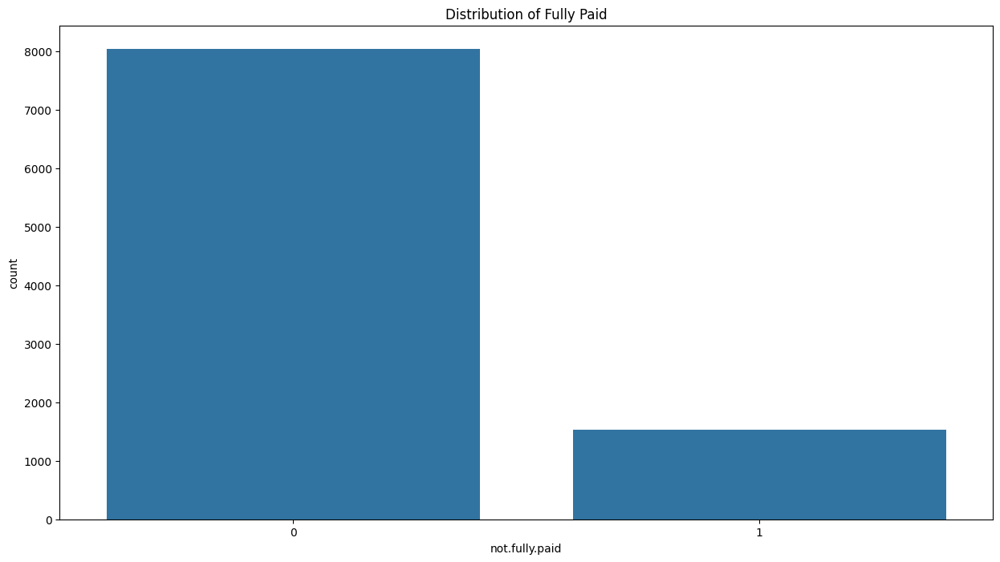

In [8]:
# Make visualization about 'Distribution of Fully Paid'
plt.figure(figsize=(15,8))
sns.countplot(df, x='not.fully.paid')
plt.title('Distribution of Fully Paid')

Mostly borrower not fully paid and imbalance data target (not.fully.paid)

Text(0.5, 1.0, 'Distribution of Purpose')

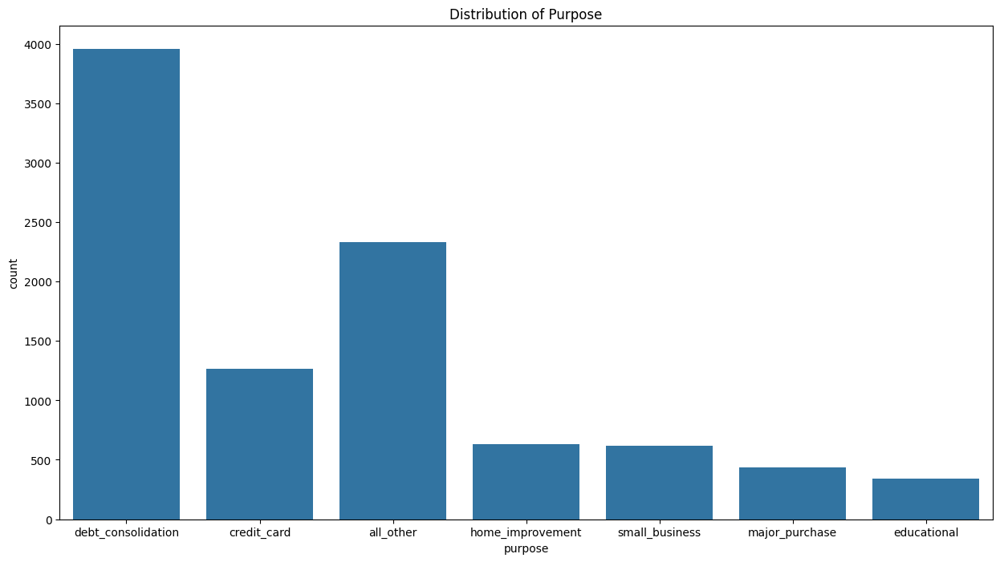

In [9]:
# Visualization about 'Distribution of Purpose'
plt.figure(figsize=(15,8))
sns.countplot(df, x='purpose')
plt.title('Distribution of Purpose')

Most loans are taken out for debt consolidation purposes

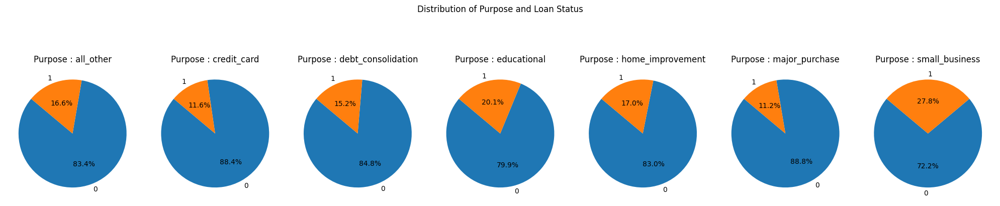

In [10]:
# Visualization to check the purpose and loan status
purpose = df.groupby(['purpose', 'not.fully.paid']).size().unstack()
purpose = purpose.T

fig, axes = plt.subplots(1, len(purpose.columns), figsize=(20, 5))

for i, column in enumerate(purpose.columns):
    axes[i].pie(purpose[column], labels=purpose.index, autopct='%1.1f%%', startangle=140)
    axes[i].set_title(f'Purpose : {column}')

plt.suptitle('Distribution of Purpose and Loan Status')
plt.tight_layout()
plt.show()

Borrowers who take out loans for small business purposes are more likely to not repay the loan in full

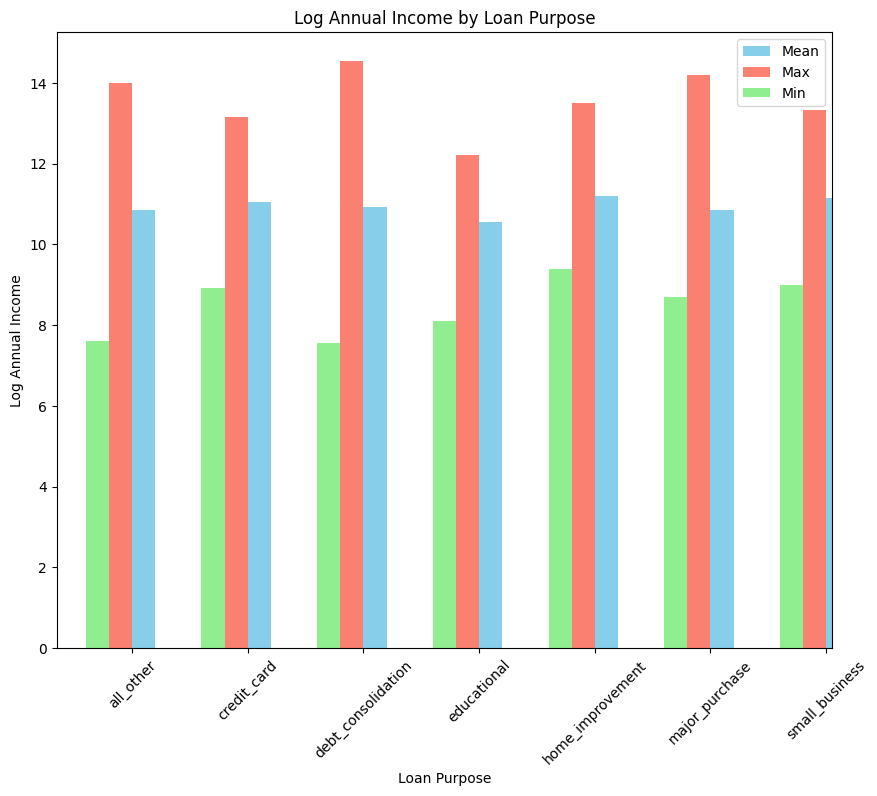

In [11]:

inc_loan_purpose = df.groupby('purpose').agg({'log.annual.inc':['mean','max','min']})
fig, ax = plt.subplots(figsize=(10, 8))

inc_loan_purpose['log.annual.inc']['mean'].plot(kind='bar', color='skyblue', position=0, width=0.2, ax=ax, label='Mean')

inc_loan_purpose['log.annual.inc']['max'].plot(kind='bar', color='salmon', position=1, width=0.2, ax=ax, label='Max')

inc_loan_purpose['log.annual.inc']['min'].plot(kind='bar', color='lightgreen', position=2, width=0.2, ax=ax, label='Min')

plt.xlabel('Loan Purpose')
plt.ylabel('Log Annual Income')
plt.title('Log Annual Income by Loan Purpose')
plt.xticks(rotation=45)
plt.legend()

plt.show()

On average, the top three purposes for borrowing are home improvement, small business, and credit card. Small business loans are associated with higher incomes but also come with a high risk of not being fully repaid.

In [12]:
# Make fico columns in category type
df['fico_category'] = np.where (df['fico']<580,'Poor',
                                np.where (df['fico']<=669,'Fair',
                                          np.where(df['fico']<=739,'Good',
                                                   np.where(df['fico']<=799,'Very Good','Exceptional'))))

fico : credit score 
- <580 poor
- 580-669 fair
- 670-739 good
- 740 - 799 very good
- 800++ Exceptional

Text(0.5, 1.0, 'Distribution of Fico')

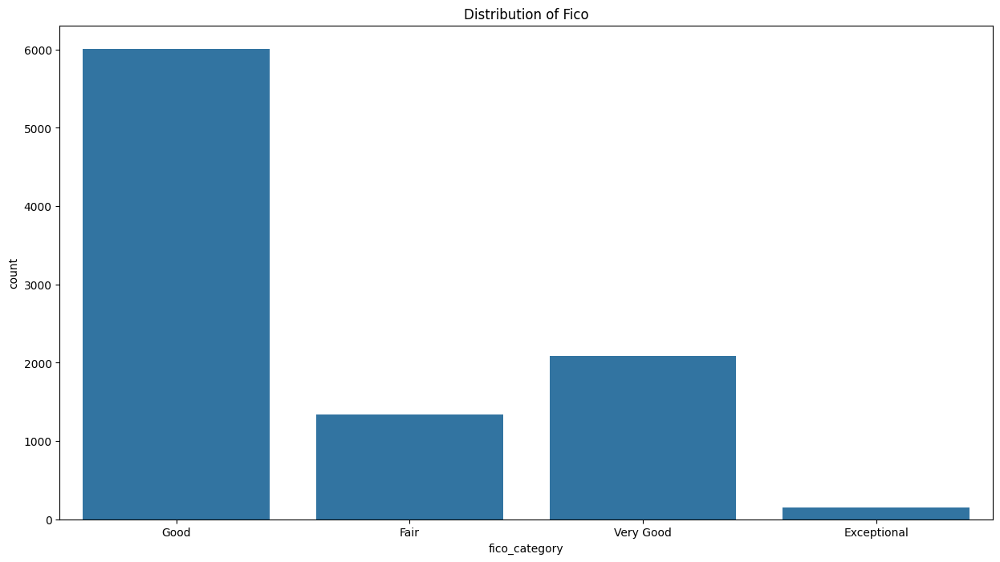

In [13]:
# check distribution of fico column
plt.figure(figsize=(15,8))
sns.countplot(df, x='fico_category')
plt.title('Distribution of Fico')

Most borrowers have a risk level of "good." There are no borrowers with a "poor" risk level.

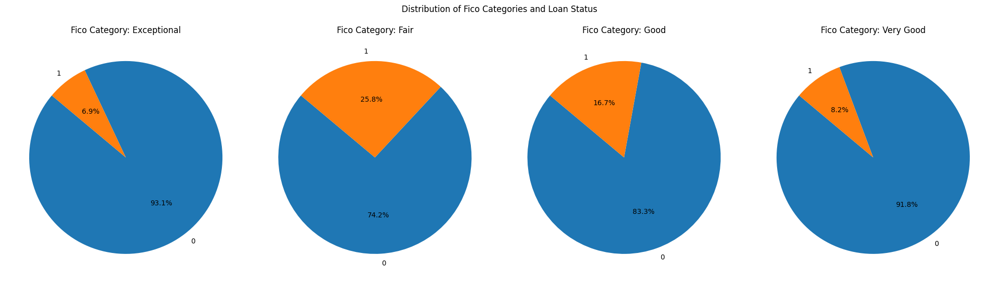

In [14]:
# check fico category and loan status
fico_counts = df.groupby(['fico_category', 'not.fully.paid']).size().unstack()
fico_counts = fico_counts.T

fig, axes = plt.subplots(1, len(fico_counts.columns), figsize=(20, 6))

for i, column in enumerate(fico_counts.columns):
    axes[i].pie(fico_counts[column], labels=fico_counts.index, autopct='%1.1f%%', startangle=140)
    axes[i].set_title(f'Fico Category: {column}')

plt.suptitle('Distribution of Fico Categories and Loan Status')
plt.tight_layout()
plt.show()

The FICO score significantly influences whether borrowers will fully repay their loans. Borrowers with a "fair" FICO score have the highest percentage of not fully repaying their loans. This percentage decreases as the FICO score improves, with "good," "very good," and "exceptional" levels showing progressively lower percentages of non-repayment.

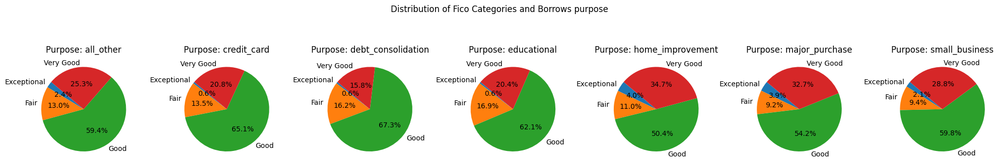

In [15]:
# check the distribution between fico category and borrow purpose
fico_counts = df.groupby(['purpose', 'fico_category']).size().unstack()
fico_counts = fico_counts.T

fig, axes = plt.subplots(1, len(fico_counts.columns), figsize=(20, 4))

for i, column in enumerate(fico_counts.columns):
    axes[i].pie(fico_counts[column], labels=fico_counts.index, autopct='%1.1f%%', startangle=140)
    axes[i].set_title(f'Purpose: {column}')

plt.suptitle('Distribution of Fico Categories and Borrows purpose')
plt.tight_layout()
plt.show()

Borrowers with educational loan purposes are mostly at the "fair" level, making them the second most likely group not to fully repay their loans.

# Preprocessing

Based on the data exploration that has been carried out, some data preprocessing is carried out as follows :

In [18]:
# make fico data in 5 category
df['fico'] = np.where (df['fico']<580,'Poor',
                                np.where (df['fico']<=669,'Fair',
                                          np.where(df['fico']<=739,'Good',
                                                   np.where(df['fico']<=799,'Very Good','Exceptional'))))
# encode fico column numerical data
le = LabelEncoder()
df['fico'] = le.fit_transform(df['fico'])
df.head()

,credit.policy,purpose,int.rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util,inq.last.6mths,delinq.2yrs,pub.rec,not.fully.paid,fico_category
0,1,debt_consolidation,0.1189,829.10,11.350407,19.48,2,5639.958333,28854,52.1,0,0,0,0,Good
1,1,credit_card,0.1071,228.22,11.082143,14.29,2,2760.000000,33623,76.7,0,0,0,0,Good
2,1,debt_consolidation,0.1357,366.86,10.373491,11.63,2,4710.000000,3511,25.6,1,0,0,0,Good
3,1,debt_consolidation,0.1008,162.34,11.350407,8.10,2,2699.958333,33667,73.2,1,0,0,0,Good
4,1,credit_card,0.1426,102.92,11.299732,14.97,1,4066.000000,4740,39.5,0,1,0,0,Fair


In [21]:
# drop fico category column has been created
df.drop(columns='fico_category', inplace=True)

In [27]:
# encode other categorical data such as purpose
le = LabelEncoder()
df['purpose'] = le.fit_transform(df['purpose'])
df.head()

,credit.policy,purpose,int.rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util,inq.last.6mths,delinq.2yrs,pub.rec,not.fully.paid
0,1,2,0.1189,829.10,11.350407,19.48,2,5639.958333,28854,52.1,0,0,0,0
1,1,1,0.1071,228.22,11.082143,14.29,2,2760.000000,33623,76.7,0,0,0,0
2,1,2,0.1357,366.86,10.373491,11.63,2,4710.000000,3511,25.6,1,0,0,0
3,1,2,0.1008,162.34,11.350407,8.10,2,2699.958333,33667,73.2,1,0,0,0
4,1,1,0.1426,102.92,11.299732,14.97,1,4066.000000,4740,39.5,0,1,0,0


In [23]:
# Check target data
df['not.fully.paid'].value_counts()

not.fully.paid
0    8045
1    1533
Name: count, dtype: int64

We have imbalance data, then we will do data balancing process with over sampling method as follows:

In [69]:
# resample using oversampling
from sklearn.utils import resample
df_majority = df[df['not.fully.paid']==0]
df_minority = df[df['not.fully.paid']==1]
 
df_minority_upsampled = resample(df_minority, 
                                 replace=True,
                                 n_samples=len(df_majority),  
                                 random_state=123)
 
df_upsampled = pd.concat([df_majority, df_minority_upsampled])
 
df_upsampled['not.fully.paid'].value_counts()

not.fully.paid
0    8045
1    8045
Name: count, dtype: int64

In [70]:
df_upsampled

,credit.policy,purpose,int.rate,installment,log.annual.inc,dti,fico,days.with.cr.line,revol.bal,revol.util,inq.last.6mths,delinq.2yrs,pub.rec,not.fully.paid
0,1,2,0.1189,829.10,11.350407,19.48,2,5639.958333,28854,52.1,0,0,0,0
1,1,1,0.1071,228.22,11.082143,14.29,2,2760.000000,33623,76.7,0,0,0,0
2,1,2,0.1357,366.86,10.373491,11.63,2,4710.000000,3511,25.6,1,0,0,0
3,1,2,0.1008,162.34,11.350407,8.10,2,2699.958333,33667,73.2,1,0,0,0
4,1,1,0.1426,102.92,11.299732,14.97,1,4066.000000,4740,39.5,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1683,1,1,0.1746,897.06,11.635143,3.94,1,4530.041667,31852,80.6,3,1,0,1
7854,0,1,0.1754,183.21,10.192419,13.44,1,419.000000,2798,71.4,0,0,0,1
8040,0,2,0.1533,383.10,10.308953,18.52,1,1110.000000,4021,72.3,3,0,0,1
9549,0,4,0.2164,729.70,11.877569,8.63,1,8280.041667,55442,66.9,9,0,1,1
